# Demo 01: Live Direct Embedding Search

This notebook is for a live demo of direct Gemini Embedding 2 retrieval.

It uses saved product embeddings, but embeds the **user query live** during the demo.

- Section 1: text query -> product text embedding vs product image embedding vs product multimodal embedding
- Section 2: image query -> product image embedding vs product multimodal embedding

Only one Google API key is needed because the notebook only calls Gemini Embedding 2 for the live query. Product embeddings are loaded from disk.


In [16]:
from __future__ import annotations

import base64
import json
import os
import sys
from pathlib import Path

import numpy as np
from IPython.display import HTML, display

ROOT = Path.cwd()
if ROOT.name == "notebooks":
    ROOT = ROOT.parent

SRC = ROOT / "src"
if str(SRC) not in sys.path:
    sys.path.insert(0, str(SRC))

from rs_demo.embeddings import NumpyEmbeddingStore  # noqa: E402
from rs_demo.gemini_embeddings import GeminiEmbeddingModel  # noqa: E402
from rs_demo.retrieval import cosine_scores  # noqa: E402

PRODUCT_PATH = ROOT / "data/extracted/product_parse_sample.jsonl"
PRODUCT_EMBEDDING_DIR = ROOT / "data/embeddings/gemini"
TOP_K = 5

ROOT


PosixPath('/Users/eltonli/code/rs-demo')

## Load Product Embeddings

These are already generated, so this cell does not call the API.

In [17]:
def load_jsonl(path: Path) -> list[dict]:
    return [json.loads(line) for line in path.read_text(encoding="utf-8").splitlines() if line]


products = {record["product_id"]: record for record in load_jsonl(PRODUCT_PATH)}
product_batch = NumpyEmbeddingStore(PRODUCT_EMBEDDING_DIR).read()
product_ids_by_row = product_batch.product_ids

print("products:", len(products))
print("product text embeddings:", product_batch.text_embeddings.shape)
print("product image embeddings:", product_batch.image_embeddings.shape)
print("product multimodal embeddings:", product_batch.multimodal_embeddings.shape)


products: 533
product text embeddings: (533, 768)
product image embeddings: (533, 768)
product multimodal embeddings: (533, 768)


## API Key

Run this once. Paste one Google API key when prompted. This notebook does not read `.env`.

In [ ]:
api_key = "xxxxx"
if not api_key:
    raise ValueError("Google API key is required for live query embedding.")

os.environ["GOOGLE_API_KEY"] = api_key
os.environ.pop("GEMINI_API_KEY", None)

embedding_model = GeminiEmbeddingModel(dimension=768)
print("Embedding model ready.")


Embedding model ready.


## Display Helpers

In [19]:
def html_escape(value: object) -> str:
    return (
        str(value or "")
        .replace("&", "&amp;")
        .replace("<", "&lt;")
        .replace(">", "&gt;")
        .replace('"', "&quot;")
    )


def resolve_path(path_value: str | Path) -> Path:
    path = Path(path_value).expanduser()
    if path.is_absolute():
        return path
    return ROOT / path


def image_tag(path: str | Path | None, width: int = 110) -> str:
    if not path:
        return ""
    image_path = resolve_path(path)
    if not image_path.exists():
        return f"<small>missing image: {html_escape(path)}</small>"
    suffix = image_path.suffix.lower().lstrip(".")
    mime = "jpeg" if suffix in {"jpg", "jpeg"} else suffix
    encoded = base64.b64encode(image_path.read_bytes()).decode("ascii")
    return f'<img src="data:image/{mime};base64,{encoded}" width="{width}">'


def product_image_path(product_id: str) -> str | None:
    record = products.get(product_id, {})
    return record.get("cropped_product_image_path") or record.get("image_path") or record.get("product_image_path")


def rank_vector(query_vector: np.ndarray, candidate_embeddings: np.ndarray, top_k: int = TOP_K) -> list[dict]:
    scores = cosine_scores(query_vector, candidate_embeddings)
    order = np.argsort(-scores, kind="stable")[:top_k]
    rows = []
    for rank, product_index in enumerate(order, start=1):
        product_id = product_ids_by_row[product_index]
        record = products[product_id]
        rows.append(
            {
                "rank": rank,
                "product_id": product_id,
                "score": float(scores[product_index]),
                "name": record.get("name"),
                "brand": record.get("brand_or_distillery"),
                "style": record.get("style"),
                "country": record.get("country"),
                "image_path": product_image_path(product_id),
            }
        )
    return rows


def result_table_html(title: str, rows: list[dict]) -> str:
    body = []
    for row in rows:
        body.append(
            "<tr>"
            "<td style='vertical-align:top'>{rank}</td>"
            "<td style='vertical-align:top'>{image}</td>"
            "<td style='vertical-align:top'><b>{name}</b><br>"
            "<code>{product_id}</code><br>"
            "<small>{brand} | {style} | {country}</small></td>"
            "<td style='vertical-align:top;text-align:right'>{score:.4f}</td>"
            "</tr>".format(
                rank=row["rank"],
                image=image_tag(row["image_path"], width=82),
                name=html_escape(row["name"]),
                product_id=html_escape(row["product_id"]),
                brand=html_escape(row["brand"]),
                style=html_escape(row["style"]),
                country=html_escape(row["country"]),
                score=row["score"],
            )
        )
    return f"""
    <div style="min-width:0; border:1px solid #ddd; padding:10px; border-radius:6px;">
      <h4 style="margin:0 0 8px 0">{html_escape(title)}</h4>
      <table style="border-collapse:collapse; width:100%; font-size:13px;">
        <thead>
          <tr style="border-bottom:1px solid #ddd; text-align:left;">
            <th>Rank</th><th>Image</th><th>Product</th><th style="text-align:right">Score</th>
          </tr>
        </thead>
        <tbody>{''.join(body)}</tbody>
      </table>
    </div>
    """


def display_comparison(
    *,
    heading: str,
    query_label: str,
    query_vector: np.ndarray,
    left_title: str,
    left_embeddings: np.ndarray,
    right_title: str,
    right_embeddings: np.ndarray,
    middle_title: str | None = None,
    middle_embeddings: np.ndarray | None = None,
    query_image_path: str | Path | None = None,
    top_k: int = TOP_K,
) -> None:
    query_html = ""
    if query_image_path:
        query_html += f"<div style='margin-bottom:8px'>{image_tag(query_image_path, width=180)}</div>"
    query_html += f"<div><b>Query:</b> {html_escape(query_label)}</div>"

    left_rows = rank_vector(query_vector, left_embeddings, top_k=top_k)
    right_rows = rank_vector(query_vector, right_embeddings, top_k=top_k)
    result_tables = [result_table_html(left_title, left_rows)]
    if middle_title is not None and middle_embeddings is not None:
        middle_rows = rank_vector(query_vector, middle_embeddings, top_k=top_k)
        result_tables.append(result_table_html(middle_title, middle_rows))
    result_tables.append(result_table_html(right_title, right_rows))

    display(HTML(f"""
    <div style="font-family:-apple-system,BlinkMacSystemFont,Segoe UI,sans-serif;">
      <h3>{html_escape(heading)}</h3>
      <div style="border-left:4px solid #555; padding:8px 12px; margin-bottom:12px; background:#f8f8f8;">
        {query_html}
      </div>
      <div style="display:grid; grid-template-columns:repeat(auto-fit, minmax(300px, 1fr)); gap:12px; align-items:flex-start;">
        {''.join(result_tables)}
      </div>
      <p style="font-size:12px;color:#666;">Scores are cosine similarity, rounded to 4 decimals.</p>
    </div>
    """))


## Section 1: Live Text Query

Type a text query when prompted. This cell makes one API call to embed the query, then ranks locally against saved product embeddings.

query embedding: (768,)


Rank,Image,Product,Score
1,,THE GLENROTHES SELECT RESERVEp0161-the-glenrothes-select-reserveTHE GLENROTHES SELECT | Single Malt |,0.6953
2,,WHISKY CASTLE FULL MOONp0365-whisky-castle-full-moonWHISKY CASTLE | Single Malt |,0.6920
3,,AUCHROISK FLORA & FAUNA 10-YEAR-OLDp0028-auchroisk-flora-fauna-10-year-oldAUCHROISK | Single Malt | Scotland,0.6876
4,,PIG’S NOSEp0289-pig-s-nosePIG’S NOSE | Blend | Scotland,0.6854
5,,PRIME BLUEp0295-prime-bluePRIME BLUE | Blended Malt | Scotland,0.6809
Rank,Image,Product,Score
1,,NANT DOUBLE MALTp0266-nant-double-maltNANT | Blended Malt | Australia,0.6232
2,,PINWINNIE ROYALEp0291-pinwinnie-royalePINWINNIE ROYALE | Blend | Scotland,0.6187
3,,PIG’S NOSEp0289-pig-s-nosePIG’S NOSE | Blend | Scotland,0.6180
4,,GOTEMBA FUJISANROKU 18-YEAR-OLDp0217-gotemba-fujisanroku-18-year-oldKIRIN GOTEMBA | Single Malt | Japan,0.6149

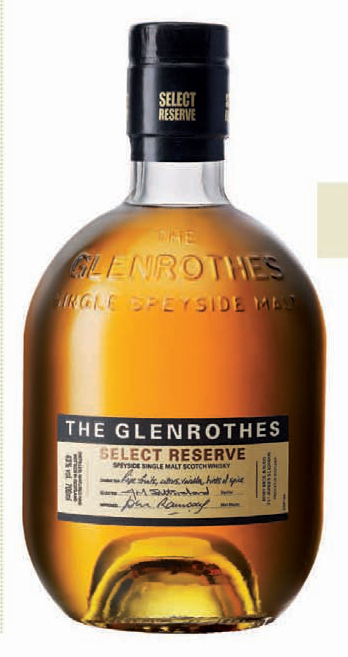
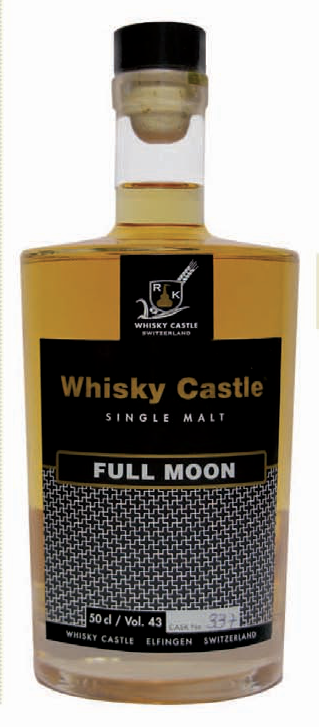
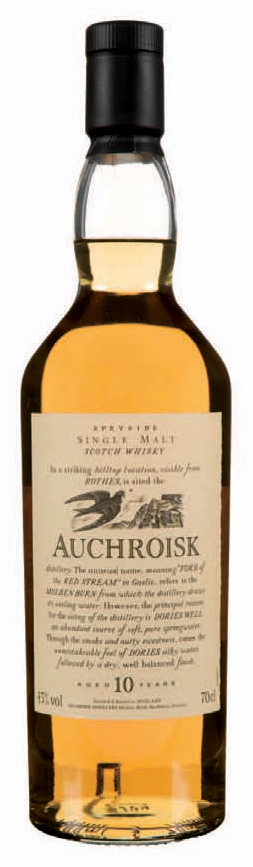
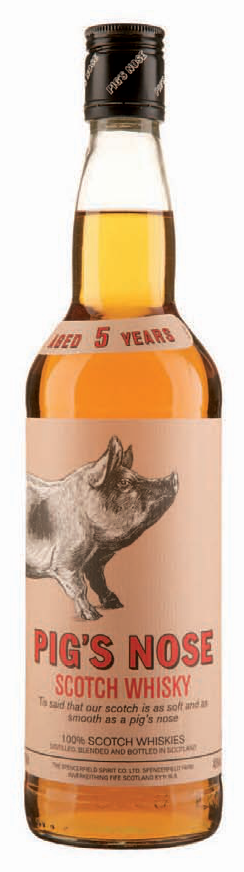
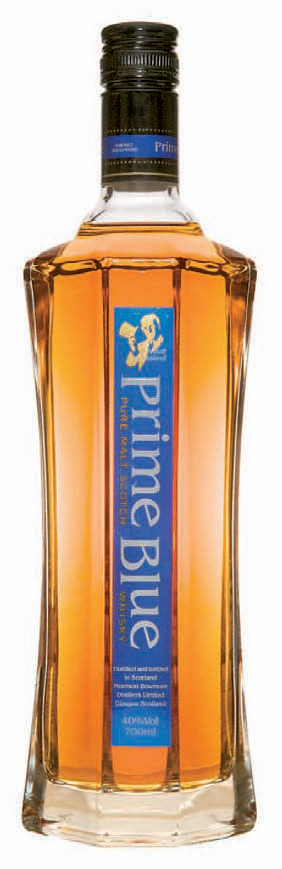
...
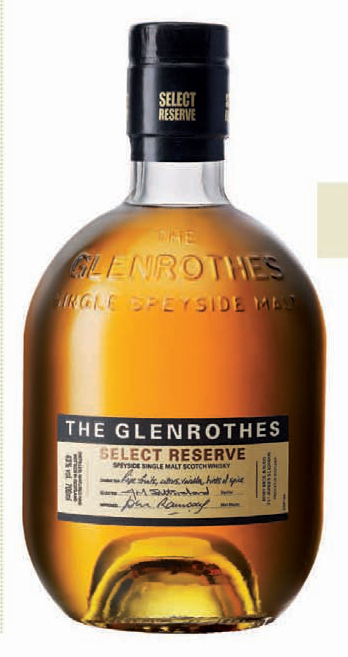
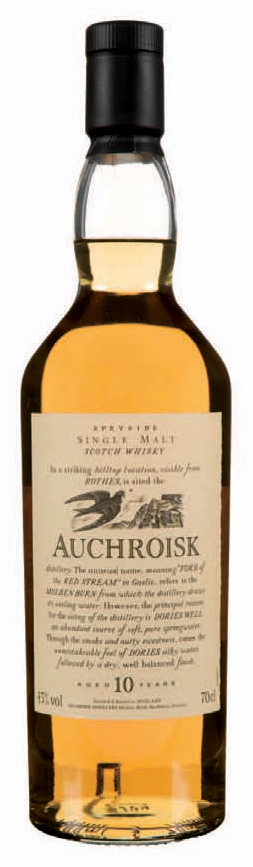
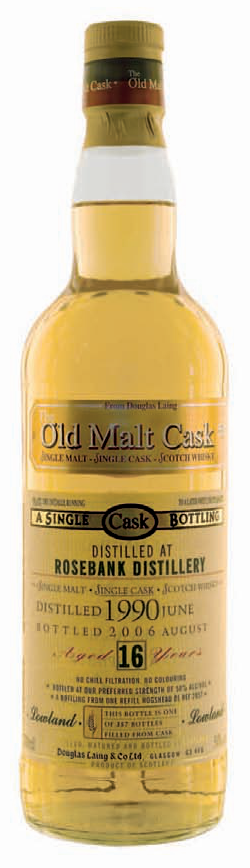
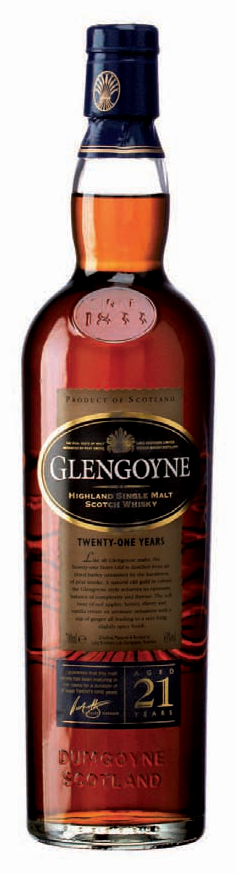
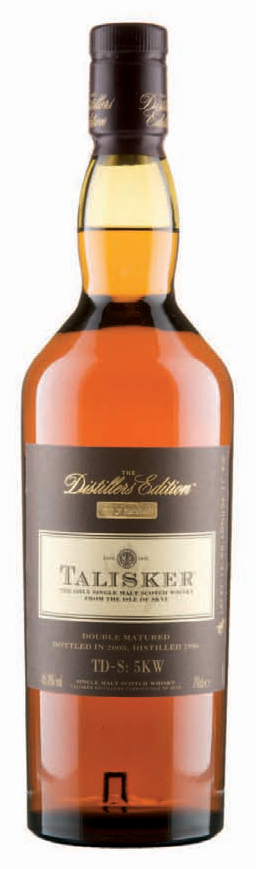

In [25]:
TEXT_QUERY = "I want a pink bottle of whisky"

if not TEXT_QUERY:
    raise ValueError("TEXT_QUERY cannot be empty")

text_query_vector = embedding_model.embed_text(f"task: search result | query: {TEXT_QUERY}")

print("query embedding:", text_query_vector.shape)

display_comparison(
    heading="Live text query results",
    query_label=TEXT_QUERY,
    query_vector=text_query_vector,
    left_title="Text query -> product text embeddings",
    left_embeddings=product_batch.text_embeddings,
    middle_title="Text query -> product image embeddings",
    middle_embeddings=product_batch.image_embeddings,
    right_title="Text query -> product multimodal embeddings",
    right_embeddings=product_batch.multimodal_embeddings,
    top_k=TOP_K,
)


query embedding: (768,)


Rank,Image,Product,Score
1,,WHISKY CASTLE FULL MOONp0365-whisky-castle-full-moonWHISKY CASTLE | Single Malt |,0.7038
2,,THE CASK OF YAMAZAKI 1990 SHERRY BUTTp0336-the-cask-of-yamazaki-1990-sherry-buttSUNTORY YAMAZAKI | Single Malt | Japan,0.7014
3,,PRIME BLUEp0295-prime-bluePRIME BLUE | Blended Malt | Scotland,0.7007
4,,"FIVE OF SPADES, DISTILLED 2000, BOTTLED 2008p0190-five-of-spades-distilled-2000-bottled-2008FIVE OF SPADES, DISTILLED | Single Malt , |",0.6978
5,,GLENALLACHIE 16-YEAR-OLD 1990p0141-glenallachie-16-year-old-1990GLENALLACHIE | Single Malt |,0.6966
Rank,Image,Product,Score
1,,TOMINTOUL 10-YEAR-OLDp0351-tomintoul-10-year-oldTOMINTOUL | Single Malt | Scotland,0.6614
2,,TOMINTOUL 16-YEAR-OLDp0351-tomintoul-16-year-oldTOMINTOUL | Single Malt | Scotland,0.6614
3,,MCCLELLAND’S HIGHLANDp0252-mcclelland-s-highlandMCCLELLAND’S | Single Malt | Scotland,0.6558
4,,MCCLELLAND’S ISLAYp0252-mcclelland-s-islayMCCLELLAND’S | Single Malt | Scotland,0.6558

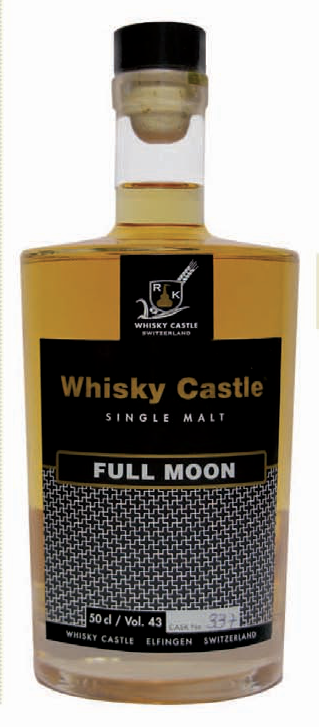
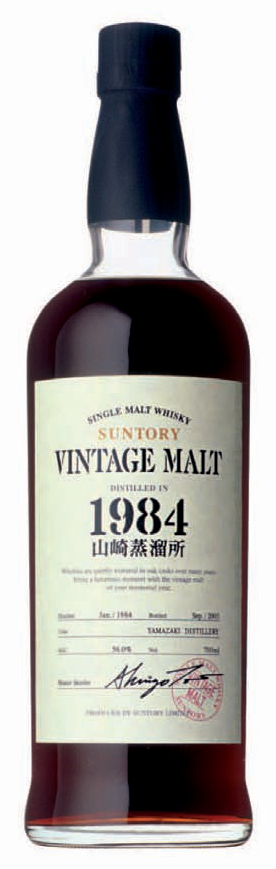
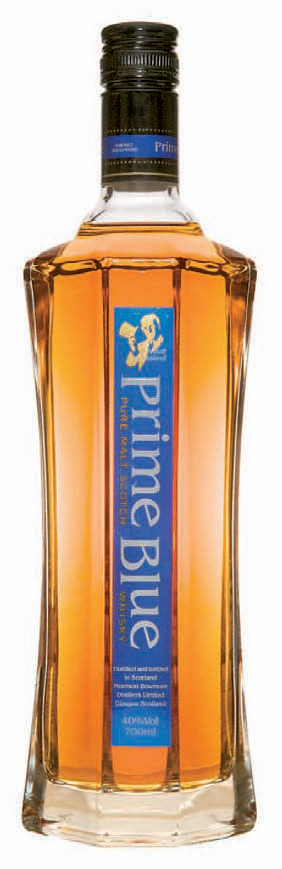
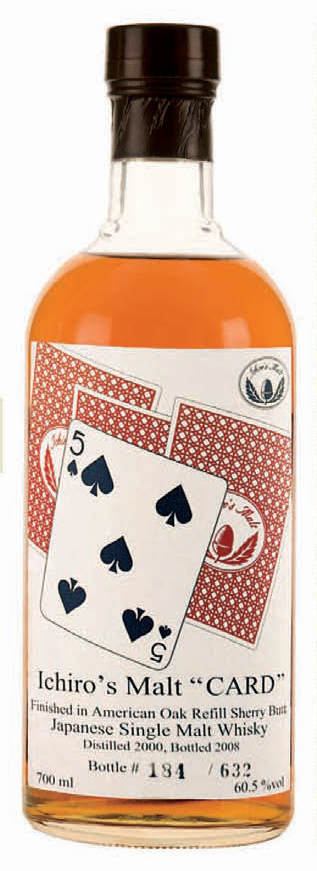
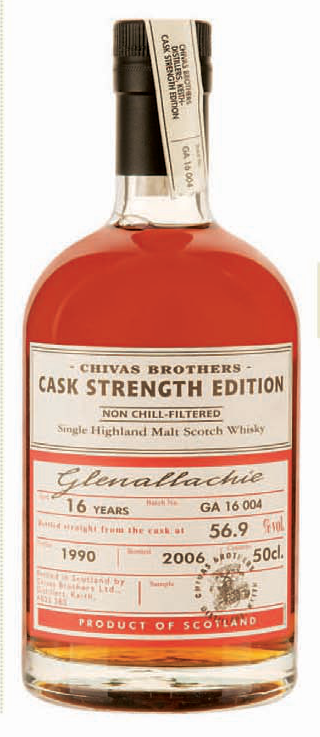
...
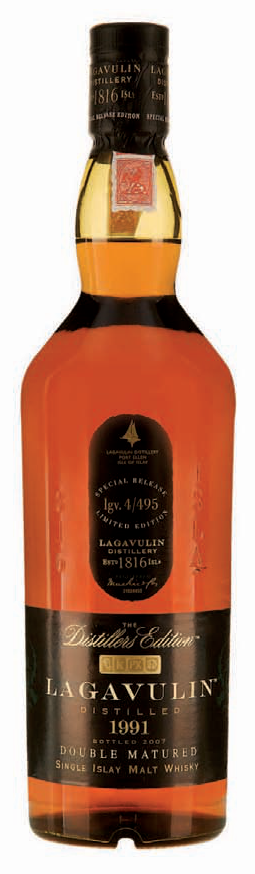
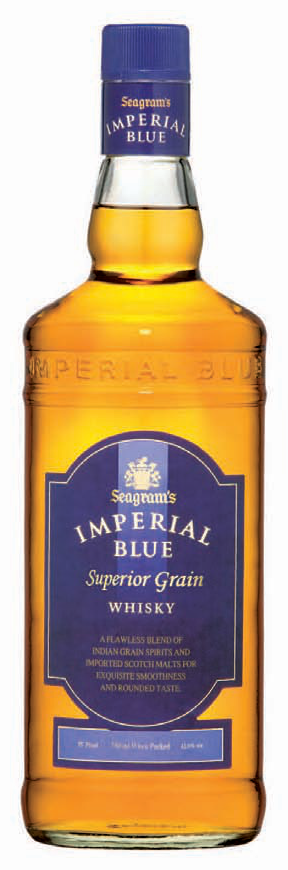
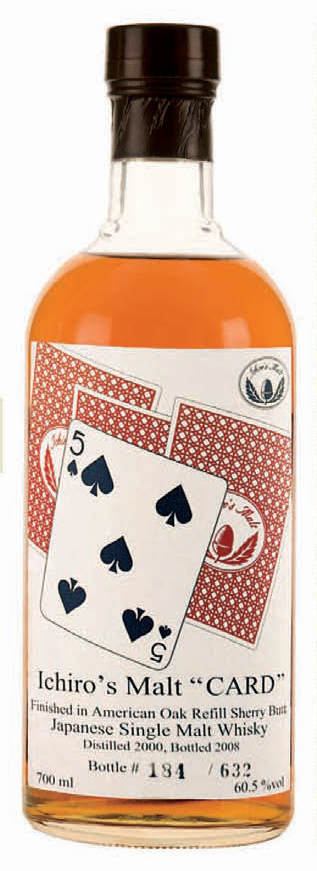
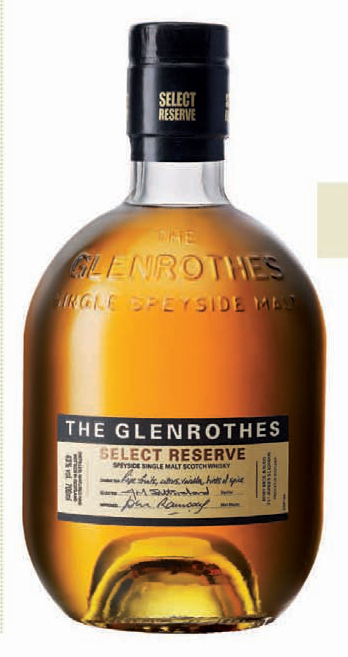
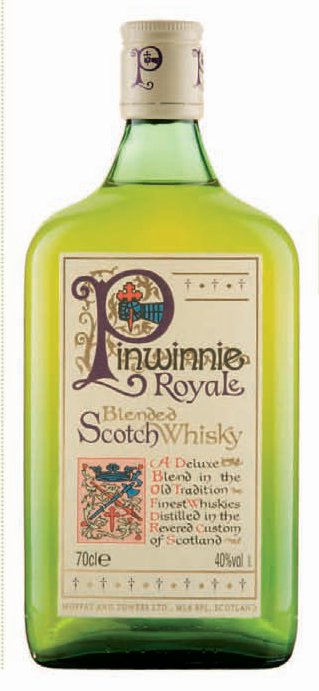

In [31]:
TEXT_QUERY = "Whisky in purple bottle"

if not TEXT_QUERY:
    raise ValueError("TEXT_QUERY cannot be empty")

text_query_vector = embedding_model.embed_text(f"task: search result | query: {TEXT_QUERY}")

print("query embedding:", text_query_vector.shape)

display_comparison(
    heading="Live text query results",
    query_label=TEXT_QUERY,
    query_vector=text_query_vector,
    left_title="Text query -> product text embeddings",
    left_embeddings=product_batch.text_embeddings,
    middle_title="Text query -> product image embeddings",
    middle_embeddings=product_batch.image_embeddings,
    right_title="Text query -> product multimodal embeddings",
    right_embeddings=product_batch.multimodal_embeddings,
    top_k=TOP_K,
)


## Section 2: Live Image Query

Type a local image path when prompted. This cell makes one API call to embed the image, then ranks locally against saved product embeddings.

Example path: data/eval/movie_scene_bottle_crops/msq004-john-wick-blantons.crop.jpg


In [ ]:
IMAGE_QUERY_PATH = input("Enter a local image path: ").strip()

if not IMAGE_QUERY_PATH:
    raise ValueError("IMAGE_QUERY_PATH cannot be empty")

resolved_image_path = resolve_path(IMAGE_QUERY_PATH)
if not resolved_image_path.exists():
    raise FileNotFoundError(resolved_image_path)

image_query_vector = embedding_model.embed_image(str(resolved_image_path))

print("query image:", resolved_image_path)
print("query embedding:", image_query_vector.shape)

display_comparison(
    heading="Live image query results",
    query_label=IMAGE_QUERY_PATH,
    query_image_path=resolved_image_path,
    query_vector=image_query_vector,
    left_title="Image query -> product image embeddings",
    left_embeddings=product_batch.image_embeddings,
    right_title="Image query -> product multimodal embeddings",
    right_embeddings=product_batch.multimodal_embeddings,
    top_k=TOP_K,
)


## Optional: Reuse Without Re-embedding

If you want to adjust top-k during the demo, rerun the display function below. It reuses the vectors already created above and does not call the API again.

In [ ]:
# Example: show more results for the latest text query without another API call.
# display_comparison(
#     heading="Live text query results",
#     query_label=TEXT_QUERY,
#     query_vector=text_query_vector,
#     left_title="Text query -> product text embeddings",
#     left_embeddings=product_batch.text_embeddings,
#     right_title="Text query -> product multimodal embeddings",
#     right_embeddings=product_batch.multimodal_embeddings,
#     top_k=10,
# )
